In [5]:
import torch
import torch.nn as nn
import torchvision.transforms as transforms
import torch.optim as optim
import torchvision.datasets as datasets
import imageio
import numpy as np
import matplotlib
from torchvision.utils import make_grid, save_image
from torch.utils.data import DataLoader
from matplotlib import pyplot as plt
from tqdm import tqdm

# Define learning parameters

In [67]:
# learning parameters
batch_size = 512
epochs = 100
sample_size = 64 # fixed sample size for generator
nz = 128 # latent vector size
k = 1 # number of steps to apply to the discriminator
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

# Prepare training dataset

In [68]:
transform = transforms.Compose([
                                transforms.ToTensor(),
                                transforms.Normalize((0.5,),(0.5,)),
])
to_pil_image = transforms.ToPILImage()

# Make input, output folders
!mkdir -p input
!mkdir -p outputs
!mkdir -p outputs_wrong
!mkdir -p outputs_cnn

# Load train data
train_data = datasets.MNIST(
    root='input/data',
    train=True,
    download=True,
    transform=transform
)
train_loader = DataLoader(train_data, batch_size=batch_size, shuffle=True)

A subdirectory or file -p already exists.
Error occurred while processing: -p.
A subdirectory or file input already exists.
Error occurred while processing: input.
A subdirectory or file -p already exists.
Error occurred while processing: -p.
A subdirectory or file outputs already exists.
Error occurred while processing: outputs.
A subdirectory or file -p already exists.
Error occurred while processing: -p.
A subdirectory or file outputs_wrong already exists.
Error occurred while processing: outputs_wrong.
A subdirectory or file -p already exists.
Error occurred while processing: -p.
A subdirectory or file outputs_cnn already exists.
Error occurred while processing: outputs_cnn.


# Generator

In [69]:
class Generator(nn.Module):
    def __init__(self, nz):
        super(Generator, self).__init__()
        self.nz = nz
        self.main = nn.Sequential(
            nn.Linear(self.nz, 256),
            nn.LeakyReLU(0.2),
            nn.Linear(256, 512),
            nn.LeakyReLU(0.2),
            nn.Linear(512, 1024),
            nn.LeakyReLU(0.2),
            nn.Linear(1024, 784),
            nn.Tanh(),
        )
    def forward(self, x):
        return self.main(x).view(-1, 1, 28, 28)

# Discriminator

In [70]:
class Discriminator(nn.Module):
    def __init__(self):
        super(Discriminator, self).__init__()
        self.n_input = 784
        self.main = nn.Sequential(
            nn.Linear(self.n_input, 1024),
            nn.LeakyReLU(0.2),
            nn.Dropout(0.3),
            nn.Linear(1024, 512),
            nn.LeakyReLU(0.2),
            nn.Dropout(0.3),
            nn.Linear(512, 256),
            nn.LeakyReLU(0.2),
            nn.Dropout(0.3),
            nn.Linear(256, 1),
            nn.Sigmoid(),
        )
    def forward(self, x):
        x = x.view(-1, 784)
        return self.main(x)

In [71]:
generator = Generator(nz).to(device)
discriminator = Discriminator().to(device)
print('##### GENERATOR #####')
print(generator)
print('######################')
print('\n##### DISCRIMINATOR #####')
print(discriminator)
print('######################')

##### GENERATOR #####
Generator(
  (main): Sequential(
    (0): Linear(in_features=128, out_features=256, bias=True)
    (1): LeakyReLU(negative_slope=0.2)
    (2): Linear(in_features=256, out_features=512, bias=True)
    (3): LeakyReLU(negative_slope=0.2)
    (4): Linear(in_features=512, out_features=1024, bias=True)
    (5): LeakyReLU(negative_slope=0.2)
    (6): Linear(in_features=1024, out_features=784, bias=True)
    (7): Tanh()
  )
)
######################

##### DISCRIMINATOR #####
Discriminator(
  (main): Sequential(
    (0): Linear(in_features=784, out_features=1024, bias=True)
    (1): LeakyReLU(negative_slope=0.2)
    (2): Dropout(p=0.3, inplace=False)
    (3): Linear(in_features=1024, out_features=512, bias=True)
    (4): LeakyReLU(negative_slope=0.2)
    (5): Dropout(p=0.3, inplace=False)
    (6): Linear(in_features=512, out_features=256, bias=True)
    (7): LeakyReLU(negative_slope=0.2)
    (8): Dropout(p=0.3, inplace=False)
    (9): Linear(in_features=256, out_features=1

# Tools for training

In [72]:
# optimizers
optim_g = optim.Adam(generator.parameters(), lr=0.0002)
optim_d = optim.Adam(discriminator.parameters(), lr=0.0002)

In [73]:
# loss function
criterion = nn.BCELoss() # Binary Cross Entropy loss

In [74]:
losses_g = [] # to store generator loss after each epoch
losses_d = [] # to store discriminator loss after each epoch
images = [] # to store images generatd by the generator

In [75]:
# to create real labels (1s)
def label_real(size):
    data = torch.ones(size, 1)
    return data.to(device)
# to create fake labels (0s)
def label_fake(size):
    data = torch.zeros(size, 1)
    return data.to(device)


In [76]:
# function to create the noise vector
def create_noise(sample_size, nz):
    # print("Insiide:", sample_size, nz)
    return torch.randn(sample_size, nz).to(device)

In [77]:
# to save the images generated by the generator
def save_generator_image(image, path):
    save_image(image, path)

In [78]:
# create the noise vector - fixed to track how GAN is trained.
noise = create_noise(sample_size, nz)

In [79]:
(len(train_data)/train_loader.batch_size)

117.1875

# Q. Write training loop

  0%|          | 0/117 [00:00<?, ?it/s]

118it [00:56,  2.09it/s]                         


Epoch 1 of 100
Generator loss: 1.47115302, Discriminator loss: 0.92538077


118it [00:59,  1.99it/s]                         


Epoch 2 of 100
Generator loss: 2.90736055, Discriminator loss: 1.35722399


118it [01:00,  1.97it/s]                         


Epoch 3 of 100
Generator loss: 6.23147821, Discriminator loss: 0.27162445


118it [00:59,  1.98it/s]                         


Epoch 4 of 100
Generator loss: 2.53013206, Discriminator loss: 0.98514706


118it [00:58,  2.01it/s]                         
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


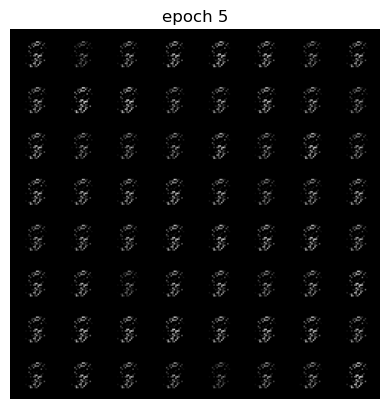

Epoch 5 of 100
Generator loss: 1.75917566, Discriminator loss: 1.12180912


118it [01:02,  1.87it/s]                         


Epoch 6 of 100
Generator loss: 2.37774110, Discriminator loss: 0.70590860


118it [00:57,  2.04it/s]                         


Epoch 7 of 100
Generator loss: 2.42188621, Discriminator loss: 1.09264243


118it [00:49,  2.40it/s]                         


Epoch 8 of 100
Generator loss: 1.96950150, Discriminator loss: 1.05019248


118it [00:49,  2.40it/s]                         


Epoch 9 of 100
Generator loss: 1.70561731, Discriminator loss: 0.95254874


118it [00:50,  2.34it/s]                         
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


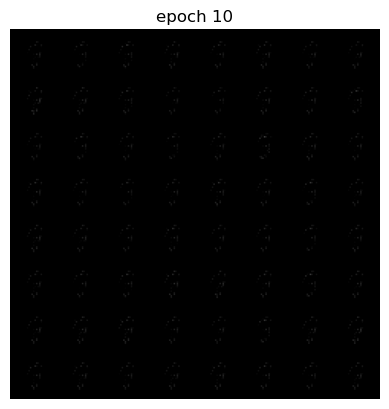

Epoch 10 of 100
Generator loss: 1.44183683, Discriminator loss: 1.16767383


118it [00:48,  2.42it/s]                         


Epoch 11 of 100
Generator loss: 1.01624203, Discriminator loss: 1.18292820


118it [00:50,  2.32it/s]                         


Epoch 12 of 100
Generator loss: 2.47556090, Discriminator loss: 0.74797899


118it [00:50,  2.36it/s]                         


Epoch 13 of 100
Generator loss: 3.85503316, Discriminator loss: 0.57497698


118it [00:51,  2.29it/s]                         


Epoch 14 of 100
Generator loss: 3.45266557, Discriminator loss: 0.73973298


118it [00:57,  2.06it/s]                         
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


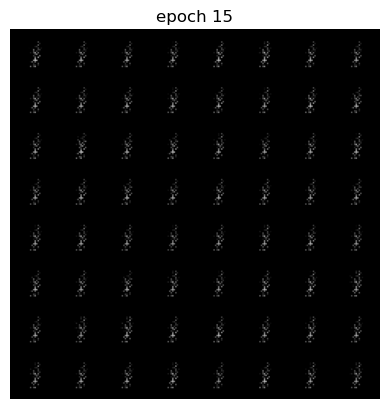

Epoch 15 of 100
Generator loss: 3.32489800, Discriminator loss: 0.40046498


118it [00:52,  2.23it/s]                         


Epoch 16 of 100
Generator loss: 4.52334261, Discriminator loss: 0.74439251


118it [00:51,  2.28it/s]                         


Epoch 17 of 100
Generator loss: 3.47520185, Discriminator loss: 0.50712347


118it [00:50,  2.33it/s]                         


Epoch 18 of 100
Generator loss: 3.88305712, Discriminator loss: 0.39286661


118it [00:50,  2.36it/s]                         


Epoch 19 of 100
Generator loss: 2.95346642, Discriminator loss: 0.63583809


118it [00:49,  2.38it/s]                         
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


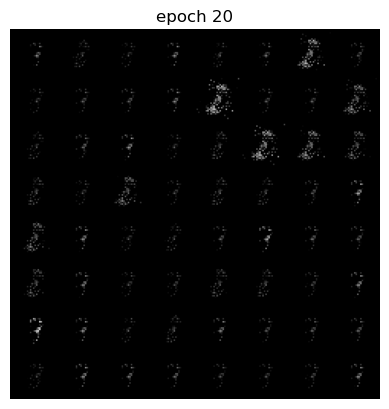

Epoch 20 of 100
Generator loss: 2.60397768, Discriminator loss: 0.64309698


118it [00:51,  2.28it/s]                         


Epoch 21 of 100
Generator loss: 3.12334204, Discriminator loss: 0.52418780


118it [00:50,  2.35it/s]                         


Epoch 22 of 100
Generator loss: 2.71828914, Discriminator loss: 0.62832290


118it [00:51,  2.29it/s]                         


Epoch 23 of 100
Generator loss: 2.70474839, Discriminator loss: 0.49608606


118it [00:50,  2.35it/s]                         


Epoch 24 of 100
Generator loss: 3.21722889, Discriminator loss: 0.40594408


118it [00:52,  2.23it/s]                         
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


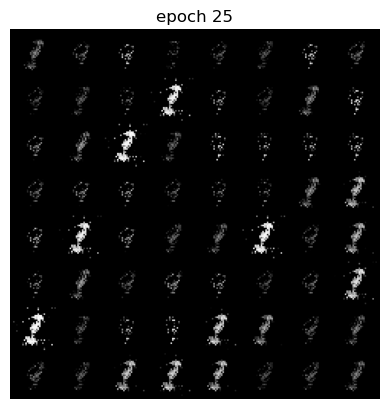

Epoch 25 of 100
Generator loss: 3.20428920, Discriminator loss: 0.40282443


118it [00:50,  2.35it/s]                         


Epoch 26 of 100
Generator loss: 3.49443674, Discriminator loss: 0.38331461


118it [00:49,  2.37it/s]                         


Epoch 27 of 100
Generator loss: 3.06876707, Discriminator loss: 0.53934854


118it [00:49,  2.40it/s]                         


Epoch 28 of 100
Generator loss: 2.89744401, Discriminator loss: 0.46508151


118it [00:52,  2.27it/s]                         


Epoch 29 of 100
Generator loss: 3.60919452, Discriminator loss: 0.38708025


118it [00:51,  2.29it/s]                         
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


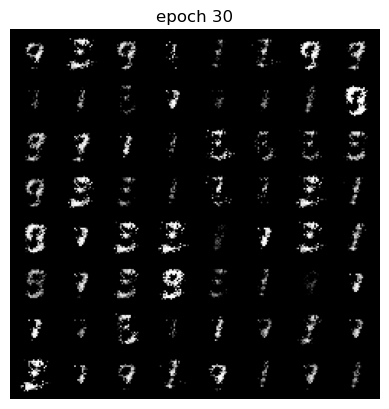

Epoch 30 of 100
Generator loss: 3.25331998, Discriminator loss: 0.48022944


118it [00:57,  2.05it/s]                         


Epoch 31 of 100
Generator loss: 3.16214037, Discriminator loss: 0.37791014


118it [00:57,  2.05it/s]                         


Epoch 32 of 100
Generator loss: 3.41481376, Discriminator loss: 0.41231400


118it [01:02,  1.88it/s]                         


Epoch 33 of 100
Generator loss: 3.00013900, Discriminator loss: 0.59740084


118it [01:09,  1.70it/s]                         


Epoch 34 of 100
Generator loss: 2.89526200, Discriminator loss: 0.50957888


118it [01:05,  1.80it/s]                         
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


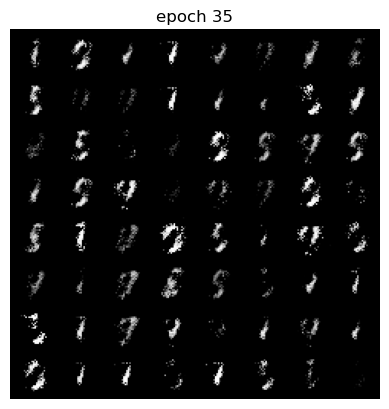

Epoch 35 of 100
Generator loss: 3.58468962, Discriminator loss: 0.32970881


118it [01:01,  1.92it/s]                         


Epoch 36 of 100
Generator loss: 3.32914591, Discriminator loss: 0.46317315


118it [00:51,  2.30it/s]                         


Epoch 37 of 100
Generator loss: 2.97077465, Discriminator loss: 0.54706502


118it [00:49,  2.39it/s]                         


Epoch 38 of 100
Generator loss: 3.57116961, Discriminator loss: 0.38290843


118it [00:48,  2.42it/s]                         


Epoch 39 of 100
Generator loss: 3.04108882, Discriminator loss: 0.51317614


118it [00:52,  2.23it/s]                         
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


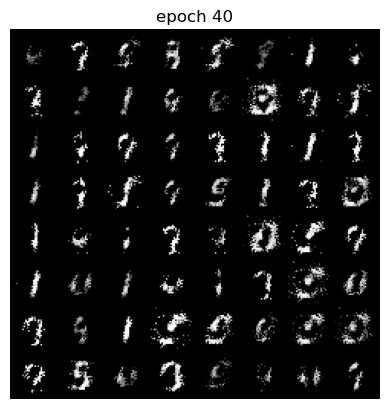

Epoch 40 of 100
Generator loss: 2.79047418, Discriminator loss: 0.50455886


118it [00:51,  2.31it/s]                         


Epoch 41 of 100
Generator loss: 3.09854484, Discriminator loss: 0.47785750


118it [00:49,  2.36it/s]                         


Epoch 42 of 100
Generator loss: 3.07941794, Discriminator loss: 0.47857794


118it [00:49,  2.37it/s]                         


Epoch 43 of 100
Generator loss: 3.27067828, Discriminator loss: 0.47647846


118it [00:50,  2.33it/s]                         


Epoch 44 of 100
Generator loss: 3.12158513, Discriminator loss: 0.51313627


118it [00:56,  2.09it/s]                         
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


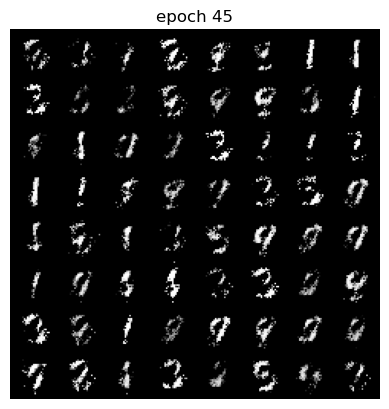

Epoch 45 of 100
Generator loss: 3.05481339, Discriminator loss: 0.50637037


118it [00:49,  2.39it/s]                         


Epoch 46 of 100
Generator loss: 3.18141627, Discriminator loss: 0.45503205


118it [00:48,  2.45it/s]                         


Epoch 47 of 100
Generator loss: 3.15130711, Discriminator loss: 0.47666258


118it [00:49,  2.37it/s]                         


Epoch 48 of 100
Generator loss: 2.98176479, Discriminator loss: 0.53250557


118it [00:52,  2.27it/s]                         


Epoch 49 of 100
Generator loss: 2.81953645, Discriminator loss: 0.54768306


118it [00:49,  2.41it/s]                         
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


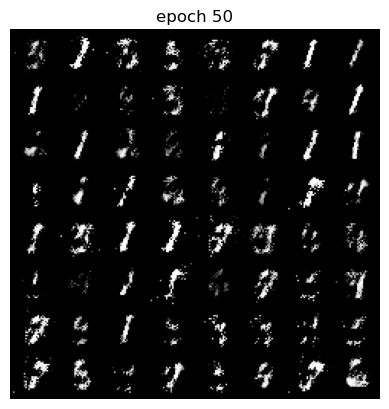

Epoch 50 of 100
Generator loss: 2.70552826, Discriminator loss: 0.55200827


118it [00:49,  2.37it/s]                         


Epoch 51 of 100
Generator loss: 2.71990943, Discriminator loss: 0.57343280


118it [00:54,  2.18it/s]                         


Epoch 52 of 100
Generator loss: 2.76822352, Discriminator loss: 0.52531356


118it [00:52,  2.24it/s]                         


Epoch 53 of 100
Generator loss: 2.93895221, Discriminator loss: 0.54221016


118it [00:51,  2.29it/s]                         


Epoch 54 of 100
Generator loss: 2.43848872, Discriminator loss: 0.68385506


118it [00:58,  2.00it/s]                         
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


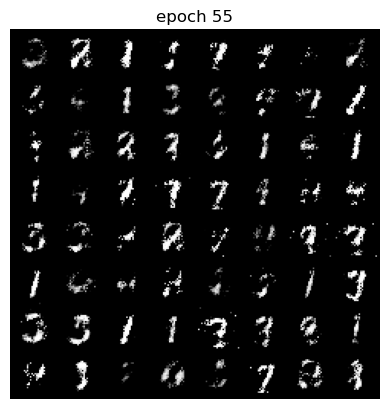

Epoch 55 of 100
Generator loss: 2.60183597, Discriminator loss: 0.58975023


118it [00:52,  2.26it/s]                         


Epoch 56 of 100
Generator loss: 2.46744275, Discriminator loss: 0.62976837


118it [00:52,  2.23it/s]                         


Epoch 57 of 100
Generator loss: 2.55227184, Discriminator loss: 0.60798407


118it [00:53,  2.22it/s]                         


Epoch 58 of 100
Generator loss: 2.63378096, Discriminator loss: 0.60931253


118it [00:49,  2.39it/s]                         


Epoch 59 of 100
Generator loss: 2.63776708, Discriminator loss: 0.55970502


118it [00:51,  2.27it/s]                         
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


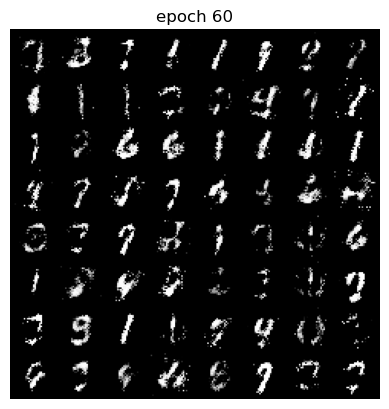

Epoch 60 of 100
Generator loss: 2.73811245, Discriminator loss: 0.56713837


118it [00:49,  2.37it/s]                         


Epoch 61 of 100
Generator loss: 2.65810823, Discriminator loss: 0.62027997


118it [00:50,  2.35it/s]                         


Epoch 62 of 100
Generator loss: 2.59436584, Discriminator loss: 0.60556406


118it [00:50,  2.31it/s]                         


Epoch 63 of 100
Generator loss: 2.58584046, Discriminator loss: 0.61502188


118it [00:50,  2.34it/s]                         


Epoch 64 of 100
Generator loss: 2.49072289, Discriminator loss: 0.65248692


118it [00:52,  2.26it/s]                         
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


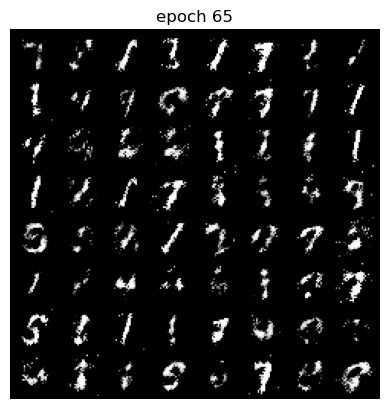

Epoch 65 of 100
Generator loss: 2.47607422, Discriminator loss: 0.64817876


118it [00:56,  2.09it/s]                         


Epoch 66 of 100
Generator loss: 2.39844871, Discriminator loss: 0.68780380


118it [00:53,  2.20it/s]                         


Epoch 67 of 100
Generator loss: 2.39956188, Discriminator loss: 0.66955090


118it [00:56,  2.08it/s]                         


Epoch 68 of 100
Generator loss: 2.65314531, Discriminator loss: 0.58308363


118it [00:54,  2.16it/s]                         


Epoch 69 of 100
Generator loss: 2.58177018, Discriminator loss: 0.58642215


118it [00:48,  2.41it/s]                         
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


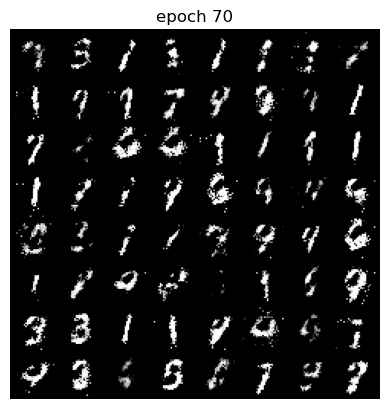

Epoch 70 of 100
Generator loss: 2.44842792, Discriminator loss: 0.63441104


118it [00:51,  2.28it/s]                         


Epoch 71 of 100
Generator loss: 2.55024457, Discriminator loss: 0.59931111


118it [01:00,  1.97it/s]                         


Epoch 72 of 100
Generator loss: 2.44115639, Discriminator loss: 0.64891863


118it [01:02,  1.89it/s]                         


Epoch 73 of 100
Generator loss: 2.48003626, Discriminator loss: 0.67404425


118it [00:55,  2.11it/s]                         


Epoch 74 of 100
Generator loss: 2.42422867, Discriminator loss: 0.68777406


118it [00:52,  2.23it/s]                         
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


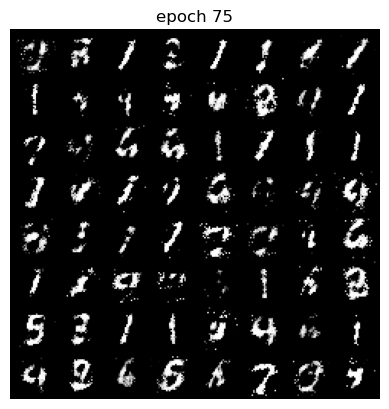

Epoch 75 of 100
Generator loss: 2.36872244, Discriminator loss: 0.71301347


118it [00:53,  2.19it/s]                         


Epoch 76 of 100
Generator loss: 2.32591677, Discriminator loss: 0.68311930


118it [00:49,  2.37it/s]                         


Epoch 77 of 100
Generator loss: 2.37022662, Discriminator loss: 0.67219704


118it [00:52,  2.24it/s]                         


Epoch 78 of 100
Generator loss: 2.37904191, Discriminator loss: 0.67401391


118it [00:47,  2.51it/s]                         


Epoch 79 of 100
Generator loss: 2.61980081, Discriminator loss: 0.64710009


118it [00:47,  2.51it/s]                         
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


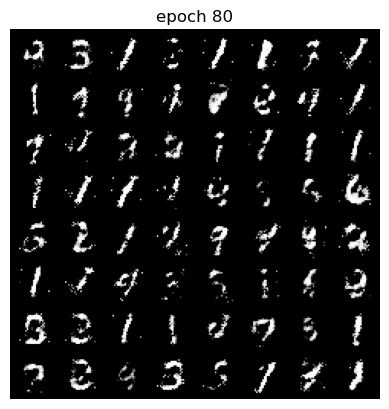

Epoch 80 of 100
Generator loss: 2.35130191, Discriminator loss: 0.66748434


118it [00:47,  2.49it/s]                         


Epoch 81 of 100
Generator loss: 2.31543612, Discriminator loss: 0.68545038


118it [00:47,  2.49it/s]                         


Epoch 82 of 100
Generator loss: 2.34522557, Discriminator loss: 0.71515560


118it [00:47,  2.50it/s]                         


Epoch 83 of 100
Generator loss: 2.33202791, Discriminator loss: 0.72403145


118it [00:47,  2.51it/s]                         


Epoch 84 of 100
Generator loss: 2.13390374, Discriminator loss: 0.74616957


118it [00:47,  2.50it/s]                         
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


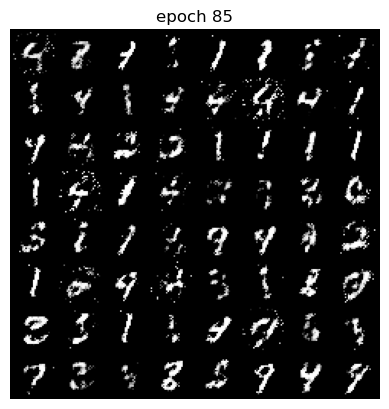

Epoch 85 of 100
Generator loss: 2.12988400, Discriminator loss: 0.74262875


118it [00:49,  2.39it/s]                         


Epoch 86 of 100
Generator loss: 2.19275522, Discriminator loss: 0.71448219


118it [00:54,  2.18it/s]                         


Epoch 87 of 100
Generator loss: 2.16461825, Discriminator loss: 0.74126077


118it [00:49,  2.38it/s]                         


Epoch 88 of 100
Generator loss: 2.23787689, Discriminator loss: 0.71600610


118it [00:50,  2.32it/s]                         


Epoch 89 of 100
Generator loss: 2.19940948, Discriminator loss: 0.73581266


118it [00:52,  2.24it/s]                         
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


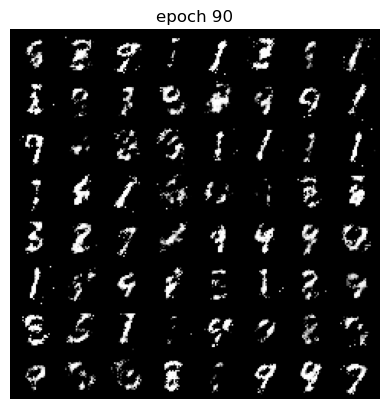

Epoch 90 of 100
Generator loss: 2.25342155, Discriminator loss: 0.69736207


118it [00:53,  2.20it/s]                         


Epoch 91 of 100
Generator loss: 2.21238828, Discriminator loss: 0.75166512


118it [00:52,  2.23it/s]                         


Epoch 92 of 100
Generator loss: 2.13036418, Discriminator loss: 0.80624706


118it [00:50,  2.34it/s]                         


Epoch 93 of 100
Generator loss: 2.12609529, Discriminator loss: 0.75274014


118it [00:50,  2.36it/s]                         


Epoch 94 of 100
Generator loss: 2.06490803, Discriminator loss: 0.75112247


118it [00:49,  2.39it/s]                         
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


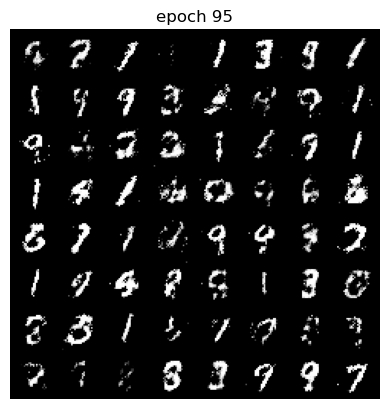

Epoch 95 of 100
Generator loss: 2.10673952, Discriminator loss: 0.76459587


118it [00:50,  2.33it/s]                         


Epoch 96 of 100
Generator loss: 2.03271532, Discriminator loss: 0.77442777


118it [00:49,  2.38it/s]                         


Epoch 97 of 100
Generator loss: 2.15381455, Discriminator loss: 0.75324196


118it [00:51,  2.29it/s]                         


Epoch 98 of 100
Generator loss: 2.13049507, Discriminator loss: 0.75228965


118it [00:55,  2.11it/s]                         


Epoch 99 of 100
Generator loss: 2.04690075, Discriminator loss: 0.77487499


118it [00:59,  1.99it/s]                         
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


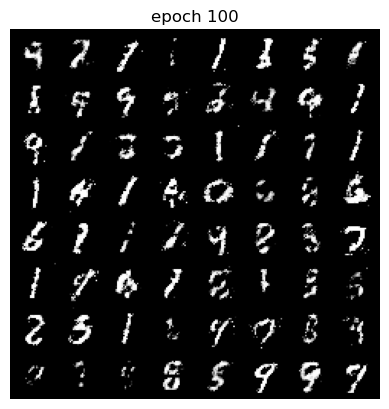

Epoch 100 of 100
Generator loss: 2.07212234, Discriminator loss: 0.76041424


In [19]:
torch.manual_seed(7777)

def generator_loss(output, true_label):
    ############ YOUR CODE HERE ##########
    
    return criterion(output, true_label)

    ######################################
    
def discriminator_loss(output, true_label):
    ############ YOUR CODE HERE ##########
    
    # print(tuple(output.size()), true_label.size())

    ones = label_real(true_label.size()[0])
    zeros = label_fake(output.size()[0])
    # temp =  criterion(output, zeros)
    return criterion(output, zeros) + criterion(true_label, ones)
    # return criterion(output, true_label)
    

    ######################################
    

for epoch in range(epochs):
    loss_g = 0.0
    loss_d = 0.0
    for bi, data in tqdm(enumerate(train_loader), total=int(len(train_data)/train_loader.batch_size)):
        ############ YOUR CODE HERE ########## 
            
        # DISCRIMINATOR TRAINING FIRST     
        discriminator.zero_grad()
        real_imgs, _ = data
        batch_size = real_imgs.size(0)
        
        real_vals = discriminator(real_imgs)        
        fake_imgs = generator(create_noise(batch_size, nz))
        fake_vals = discriminator(fake_imgs.detach())
        # print(real_vals.shape, fake_vals.shape)
        err_disc = discriminator_loss(fake_vals, real_vals)
        # print(err_disc)
        loss_d += err_disc
        err_disc.backward()
        optim_d.step()
        
        # GENERATOR TRAINING AFTER
        generator.zero_grad()
        # we have updated discriminator so:
        fake_imgs_gen = generator(create_noise(batch_size, nz))
        gen_fake_vals = discriminator(fake_imgs_gen)      
        labels_one = label_real(batch_size)
        err_gen = generator_loss(gen_fake_vals, labels_one)
        loss_g += err_gen
        err_gen.backward()
        optim_g.step()
        # print(len(x), x.shape)

        
        # break
        
    
        ######################################
    
    
    # create the final fake image for the epoch
    generated_img = generator(noise).cpu().detach()
    
    # make the images as grid
    generated_img = make_grid(generated_img)
    
    # visualize generated images
    if (epoch + 1) % 5 == 0:
        plt.imshow(generated_img.permute(1, 2, 0))
        plt.title(f'epoch {epoch+1}')
        plt.axis('off')
        plt.show()
    
    # save the generated torch tensor models to disk
    save_generator_image(generated_img, f"outputs/gen_img{epoch+1}.png")
    images.append(generated_img)
    epoch_loss_g = loss_g / bi # total generator loss for the epoch
    epoch_loss_d = loss_d / bi # total discriminator loss for the epoch
    losses_g.append(epoch_loss_g)
    losses_d.append(epoch_loss_d)
    
    print(f"Epoch {epoch+1} of {epochs}")
    print(f"Generator loss: {epoch_loss_g:.8f}, Discriminator loss: {epoch_loss_d:.8f}")

In [20]:
print('DONE TRAINING')
torch.save(generator.state_dict(), 'outputs/generator.pth')

DONE TRAINING


In [21]:
# save the generated images as GIF file
imgs = [np.array(to_pil_image(img)) for img in images]
imageio.mimsave('outputs/generator_images.gif', imgs)

In [24]:
losses_d  =[x.detach() for x in losses_d]
losses_g  =[x.detach() for x in losses_g]

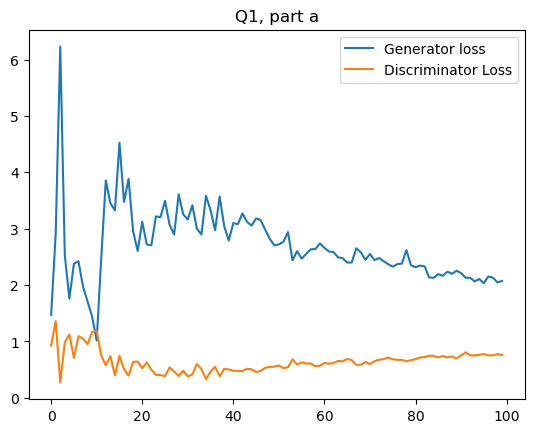

In [26]:
# plot and save the generator and discriminator loss
plt.figure()
plt.plot(losses_g, label='Generator loss')
plt.plot(losses_d, label='Discriminator Loss')
plt.title("Q1, part a")
plt.legend()
plt.savefig('outputs/loss.png')

## Changing loss
I use the same functions and code as the one for the original code as I only need to change the loss function for the generator. Everything else remains the same. 

In [80]:
losses_g_wrong = [] # to store generator loss after each epoch
losses_d_wrong = [] # to store discriminator loss after each epoch
images_wrong = [] # to store images generatd by the generator

118it [00:45,  2.58it/s]                         


Epoch 1 of 100
Generator loss: 0.05979831, Discriminator loss: 0.08242623


118it [00:47,  2.49it/s]                         


Epoch 2 of 100
Generator loss: 0.00000000, Discriminator loss: 0.00000000


118it [00:48,  2.43it/s]                         


Epoch 3 of 100
Generator loss: 0.00000000, Discriminator loss: 0.00000000


118it [00:49,  2.41it/s]                         


Epoch 4 of 100
Generator loss: 0.00000000, Discriminator loss: 0.00000000


118it [00:49,  2.38it/s]                         
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


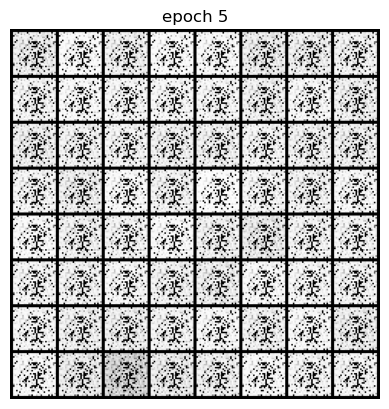

Epoch 5 of 100
Generator loss: 0.00000000, Discriminator loss: 0.00000000


118it [00:49,  2.37it/s]                         


Epoch 6 of 100
Generator loss: 0.00000000, Discriminator loss: 0.00000000


118it [00:49,  2.40it/s]                         


Epoch 7 of 100
Generator loss: 0.00000000, Discriminator loss: 0.00000000


118it [00:48,  2.42it/s]                         


Epoch 8 of 100
Generator loss: 0.00000000, Discriminator loss: 0.00000000


118it [00:49,  2.41it/s]                         


Epoch 9 of 100
Generator loss: 0.00000000, Discriminator loss: 0.00000000


118it [00:48,  2.41it/s]                         
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


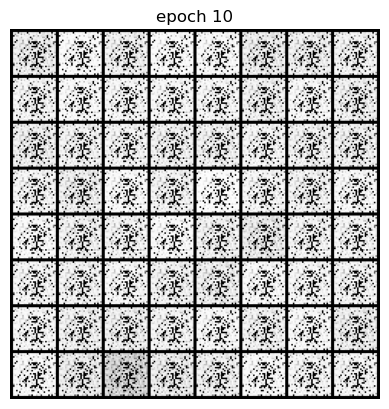

Epoch 10 of 100
Generator loss: 0.00000000, Discriminator loss: 0.00000000


118it [00:49,  2.39it/s]                         


Epoch 11 of 100
Generator loss: 0.00000000, Discriminator loss: 0.00000000


118it [00:48,  2.41it/s]                         


Epoch 12 of 100
Generator loss: 0.00000000, Discriminator loss: 0.00000000


118it [00:48,  2.41it/s]                         


Epoch 13 of 100
Generator loss: 0.00000000, Discriminator loss: 0.00000000


118it [00:48,  2.41it/s]                         


Epoch 14 of 100
Generator loss: 0.00000000, Discriminator loss: 0.00000000


118it [00:50,  2.32it/s]                         
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


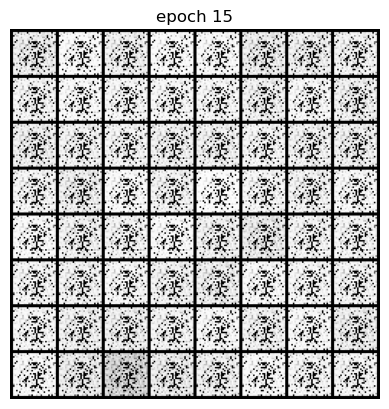

Epoch 15 of 100
Generator loss: 0.00000000, Discriminator loss: 0.00000000


118it [00:49,  2.39it/s]                         


Epoch 16 of 100
Generator loss: 0.00000000, Discriminator loss: 0.00000000


118it [00:49,  2.40it/s]                         


Epoch 17 of 100
Generator loss: 0.00000000, Discriminator loss: 0.00000000


118it [00:49,  2.40it/s]                         


Epoch 18 of 100
Generator loss: 0.00000000, Discriminator loss: 0.00000000


118it [00:49,  2.38it/s]                         


Epoch 19 of 100
Generator loss: 0.00000000, Discriminator loss: 0.00000000


118it [00:49,  2.39it/s]                         
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


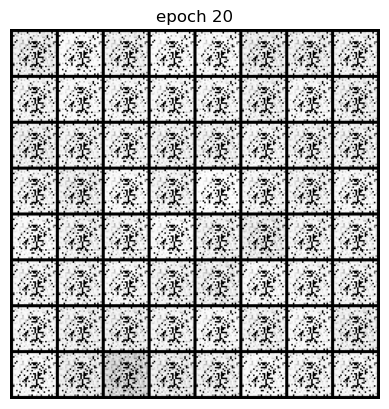

Epoch 20 of 100
Generator loss: 0.00000000, Discriminator loss: 0.00000000


118it [00:49,  2.38it/s]                         


Epoch 21 of 100
Generator loss: 0.00000000, Discriminator loss: 0.00000000


118it [00:49,  2.38it/s]                         


Epoch 22 of 100
Generator loss: 0.00000000, Discriminator loss: 0.00000000


118it [00:49,  2.38it/s]                         


Epoch 23 of 100
Generator loss: 0.00000000, Discriminator loss: 0.00000000


118it [00:49,  2.38it/s]                         


Epoch 24 of 100
Generator loss: 0.00000000, Discriminator loss: 0.00000000


118it [00:49,  2.37it/s]                         
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


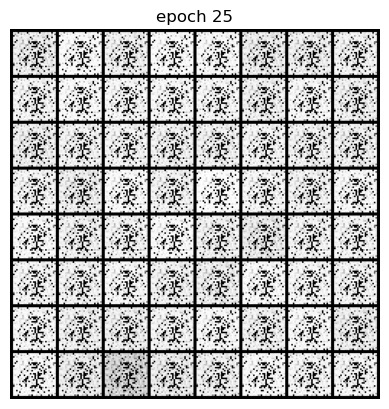

Epoch 25 of 100
Generator loss: 0.00000000, Discriminator loss: 0.00000000


118it [00:49,  2.37it/s]                         


Epoch 26 of 100
Generator loss: 0.00000000, Discriminator loss: 0.00000000


118it [00:49,  2.39it/s]                         


Epoch 27 of 100
Generator loss: 0.00000000, Discriminator loss: 0.00000000


118it [00:49,  2.38it/s]                         


Epoch 28 of 100
Generator loss: 0.00000000, Discriminator loss: 0.00000000


118it [00:49,  2.38it/s]                         


Epoch 29 of 100
Generator loss: 0.00000000, Discriminator loss: 0.00000000


118it [00:49,  2.37it/s]                         
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


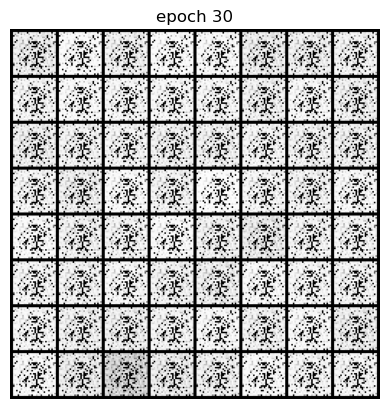

Epoch 30 of 100
Generator loss: 0.00000000, Discriminator loss: 0.00000000


118it [00:50,  2.35it/s]                         


Epoch 31 of 100
Generator loss: 0.00000000, Discriminator loss: 0.00000000


118it [00:49,  2.36it/s]                         


Epoch 32 of 100
Generator loss: 0.00000000, Discriminator loss: 0.00000000


118it [00:49,  2.37it/s]                         


Epoch 33 of 100
Generator loss: 0.00000000, Discriminator loss: 0.00000000


118it [00:49,  2.37it/s]                         


Epoch 34 of 100
Generator loss: 0.00000000, Discriminator loss: 0.00000000


118it [00:49,  2.36it/s]                         
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


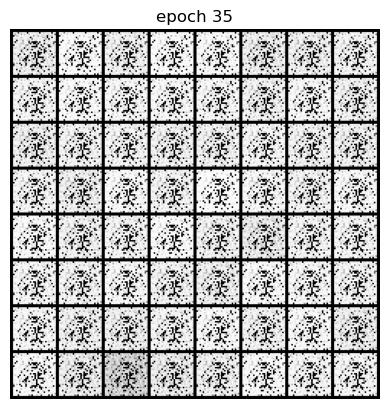

Epoch 35 of 100
Generator loss: 0.00000000, Discriminator loss: 0.00000000


118it [00:49,  2.38it/s]                         


Epoch 36 of 100
Generator loss: 0.00000000, Discriminator loss: 0.00000000


118it [00:50,  2.35it/s]                         


Epoch 37 of 100
Generator loss: 0.00000000, Discriminator loss: 0.00000000


118it [00:49,  2.36it/s]                         


Epoch 38 of 100
Generator loss: 0.00000000, Discriminator loss: 0.00000000


118it [00:49,  2.37it/s]                         


Epoch 39 of 100
Generator loss: 0.00000000, Discriminator loss: 0.00000000


118it [00:49,  2.38it/s]                         
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


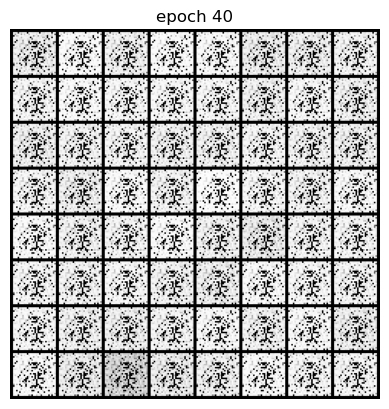

Epoch 40 of 100
Generator loss: 0.00000000, Discriminator loss: 0.00000000


118it [00:50,  2.36it/s]                         


Epoch 41 of 100
Generator loss: 0.00000000, Discriminator loss: 0.00000000


118it [00:50,  2.35it/s]                         


Epoch 42 of 100
Generator loss: 0.00000000, Discriminator loss: 0.00000000


118it [00:49,  2.36it/s]                         


Epoch 43 of 100
Generator loss: 0.00000000, Discriminator loss: 0.00000000


118it [00:50,  2.35it/s]                         


Epoch 44 of 100
Generator loss: 0.00000000, Discriminator loss: 0.00000000


118it [00:50,  2.36it/s]                         
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


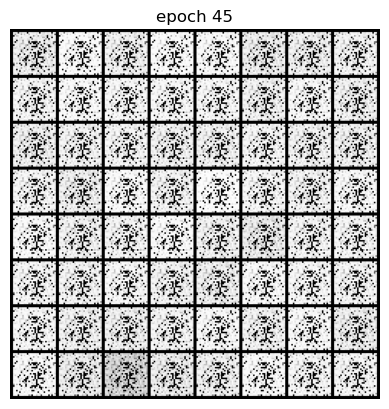

Epoch 45 of 100
Generator loss: 0.00000000, Discriminator loss: 0.00000000


118it [00:50,  2.35it/s]                         


Epoch 46 of 100
Generator loss: 0.00000000, Discriminator loss: 0.00000000


118it [00:50,  2.36it/s]                         


Epoch 47 of 100
Generator loss: 0.00000000, Discriminator loss: 0.00000000


118it [00:50,  2.35it/s]                         


Epoch 48 of 100
Generator loss: 0.00000000, Discriminator loss: 0.00000000


118it [00:50,  2.35it/s]                         


Epoch 49 of 100
Generator loss: 0.00000000, Discriminator loss: 0.00000000


118it [00:50,  2.33it/s]                         
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


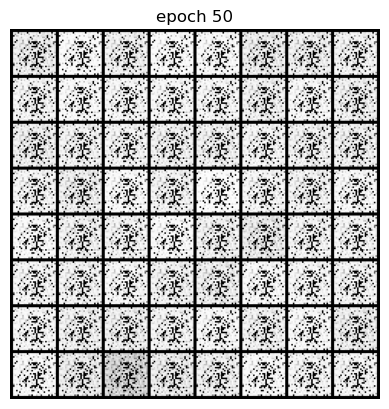

Epoch 50 of 100
Generator loss: 0.00000000, Discriminator loss: 0.00000000


118it [00:50,  2.35it/s]                         


Epoch 51 of 100
Generator loss: 0.00000000, Discriminator loss: 0.00000000


118it [00:50,  2.35it/s]                         


Epoch 52 of 100
Generator loss: 0.00000000, Discriminator loss: 0.00000000


118it [00:50,  2.34it/s]                         


Epoch 53 of 100
Generator loss: 0.00000000, Discriminator loss: 0.00000000


118it [00:51,  2.31it/s]                         


Epoch 54 of 100
Generator loss: 0.00000000, Discriminator loss: 0.00000000


118it [00:51,  2.31it/s]                         
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


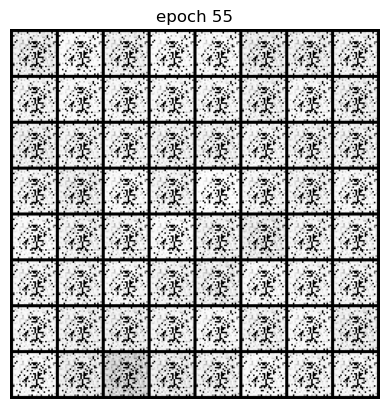

Epoch 55 of 100
Generator loss: 0.00000000, Discriminator loss: 0.00000000


118it [00:50,  2.33it/s]                         


Epoch 56 of 100
Generator loss: 0.00000000, Discriminator loss: 0.00000000


118it [00:50,  2.34it/s]                         


Epoch 57 of 100
Generator loss: 0.00000000, Discriminator loss: 0.00000000


118it [00:50,  2.32it/s]                         


Epoch 58 of 100
Generator loss: 0.00000000, Discriminator loss: 0.00000000


118it [00:50,  2.33it/s]                         


Epoch 59 of 100
Generator loss: 0.00000000, Discriminator loss: 0.00000000


118it [00:50,  2.32it/s]                         
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


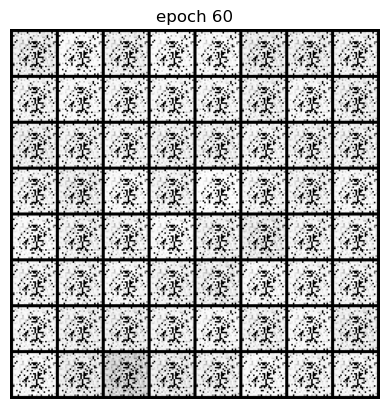

Epoch 60 of 100
Generator loss: 0.00000000, Discriminator loss: 0.00000000


118it [00:50,  2.33it/s]                         


Epoch 61 of 100
Generator loss: 0.00000000, Discriminator loss: 0.00000000


118it [00:50,  2.32it/s]                         


Epoch 62 of 100
Generator loss: 0.00000000, Discriminator loss: 0.00000000


118it [00:50,  2.32it/s]                         


Epoch 63 of 100
Generator loss: 0.00000000, Discriminator loss: 0.00000000


118it [00:50,  2.32it/s]                         


Epoch 64 of 100
Generator loss: 0.00000000, Discriminator loss: 0.00000000


118it [00:50,  2.32it/s]                         
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


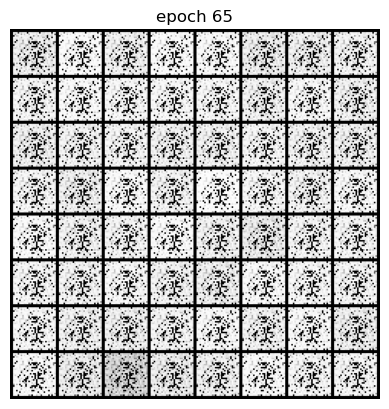

Epoch 65 of 100
Generator loss: 0.00000000, Discriminator loss: 0.00000000


118it [00:50,  2.32it/s]                         


Epoch 66 of 100
Generator loss: 0.00000000, Discriminator loss: 0.00000000


118it [00:50,  2.32it/s]                         


Epoch 67 of 100
Generator loss: 0.00000000, Discriminator loss: 0.00000000


118it [00:50,  2.33it/s]                         


Epoch 68 of 100
Generator loss: 0.00000000, Discriminator loss: 0.00000000


118it [00:50,  2.33it/s]                         


Epoch 69 of 100
Generator loss: 0.00000000, Discriminator loss: 0.00000000


118it [00:50,  2.32it/s]                         
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


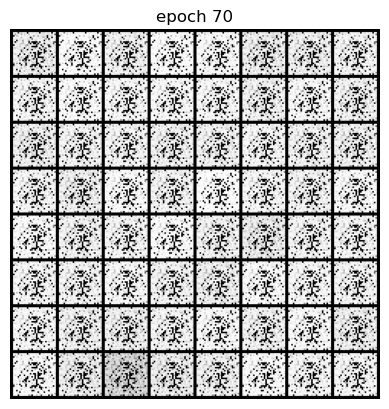

Epoch 70 of 100
Generator loss: 0.00000000, Discriminator loss: 0.00000000


118it [00:50,  2.32it/s]                         


Epoch 71 of 100
Generator loss: 0.00000000, Discriminator loss: 0.00000000


118it [00:51,  2.31it/s]                         


Epoch 72 of 100
Generator loss: 0.00000000, Discriminator loss: 0.00000000


118it [00:50,  2.32it/s]                         


Epoch 73 of 100
Generator loss: 0.00000000, Discriminator loss: 0.00000000


118it [00:51,  2.31it/s]                         


Epoch 74 of 100
Generator loss: 0.00000000, Discriminator loss: 0.00000000


118it [00:50,  2.32it/s]                         
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


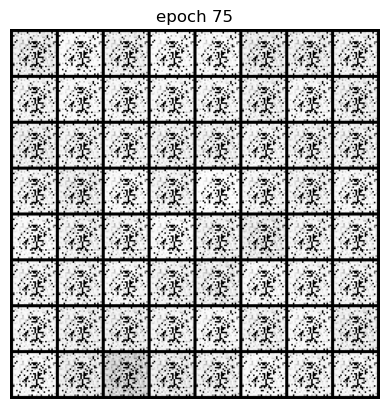

Epoch 75 of 100
Generator loss: 0.00000000, Discriminator loss: 0.00000000


118it [00:50,  2.32it/s]                         


Epoch 76 of 100
Generator loss: 0.00000000, Discriminator loss: 0.00000000


118it [00:51,  2.29it/s]                         


Epoch 77 of 100
Generator loss: 0.00000000, Discriminator loss: 0.00000000


118it [00:50,  2.32it/s]                         


Epoch 78 of 100
Generator loss: 0.00000000, Discriminator loss: 0.00000000


118it [00:50,  2.33it/s]                         


Epoch 79 of 100
Generator loss: 0.00000000, Discriminator loss: 0.00000000


118it [00:50,  2.32it/s]                         
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


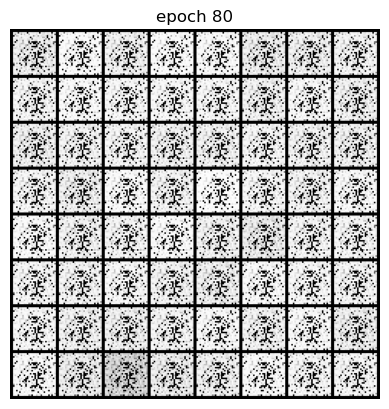

Epoch 80 of 100
Generator loss: 0.00000000, Discriminator loss: 0.00000000


118it [00:51,  2.31it/s]                         


Epoch 81 of 100
Generator loss: 0.00000000, Discriminator loss: 0.00000000


118it [00:51,  2.30it/s]                         


Epoch 82 of 100
Generator loss: 0.00000000, Discriminator loss: 0.00000000


118it [00:51,  2.31it/s]                         


Epoch 83 of 100
Generator loss: 0.00000000, Discriminator loss: 0.00000000


118it [00:50,  2.31it/s]                         


Epoch 84 of 100
Generator loss: 0.00000000, Discriminator loss: 0.00000000


118it [00:50,  2.32it/s]                         
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


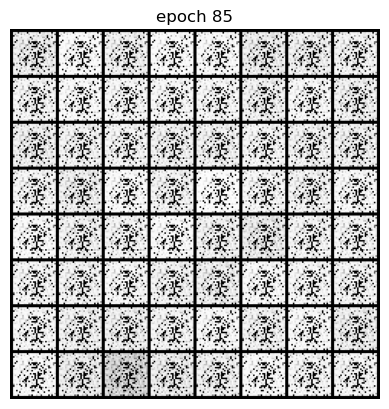

Epoch 85 of 100
Generator loss: 0.00000000, Discriminator loss: 0.00000000


118it [00:51,  2.30it/s]                         


Epoch 86 of 100
Generator loss: 0.00000000, Discriminator loss: 0.00000000


118it [00:51,  2.30it/s]                         


Epoch 87 of 100
Generator loss: 0.00000000, Discriminator loss: 0.00000000


118it [00:51,  2.29it/s]                         


Epoch 88 of 100
Generator loss: 0.00000000, Discriminator loss: 0.00000000


118it [00:51,  2.30it/s]                         


Epoch 89 of 100
Generator loss: 0.00000000, Discriminator loss: 0.00000000


118it [00:51,  2.29it/s]                         
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


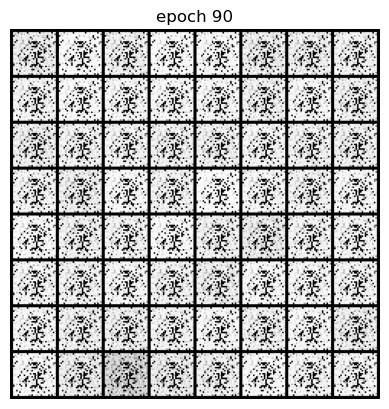

Epoch 90 of 100
Generator loss: 0.00000000, Discriminator loss: 0.00000000


118it [00:51,  2.27it/s]                         


Epoch 91 of 100
Generator loss: 0.00000000, Discriminator loss: 0.00000000


118it [00:51,  2.29it/s]                         


Epoch 92 of 100
Generator loss: 0.00000000, Discriminator loss: 0.00000000


118it [00:51,  2.29it/s]                         


Epoch 93 of 100
Generator loss: 0.00000000, Discriminator loss: 0.00000000


118it [00:51,  2.29it/s]                         


Epoch 94 of 100
Generator loss: 0.00000000, Discriminator loss: 0.00000000


118it [00:51,  2.28it/s]                         
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


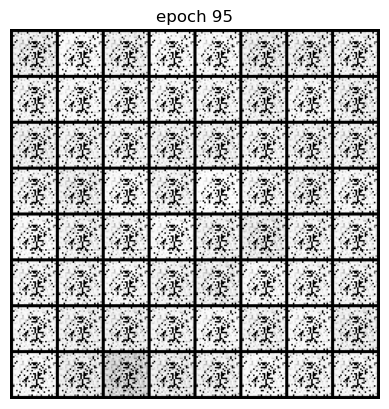

Epoch 95 of 100
Generator loss: 0.00000000, Discriminator loss: 0.00000000


118it [00:51,  2.27it/s]                         


Epoch 96 of 100
Generator loss: 0.00000000, Discriminator loss: 0.00000000


118it [00:51,  2.27it/s]                         


Epoch 97 of 100
Generator loss: 0.00000000, Discriminator loss: 0.00000000


118it [00:51,  2.27it/s]                         


Epoch 98 of 100
Generator loss: 0.00000000, Discriminator loss: 0.00000000


118it [00:51,  2.28it/s]                         


Epoch 99 of 100
Generator loss: 0.00000000, Discriminator loss: 0.00000000


118it [00:52,  2.27it/s]                         
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


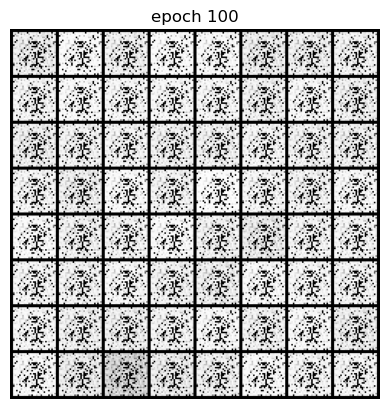

Epoch 100 of 100
Generator loss: 0.00000000, Discriminator loss: 0.00000000


In [81]:
torch.manual_seed(7777)

def generator_loss(output, true_label):
    ############ YOUR CODE HERE ##########
    
    return criterion(output, true_label)

    ######################################
    
def discriminator_loss(output, true_label):
    ############ YOUR CODE HERE ##########
    
    # print(tuple(output.size()), true_label.size())

    ones = label_real(true_label.size()[0])
    zeros = label_fake(output.size()[0])
    # temp =  criterion(output, zeros)
    return criterion(output, zeros) + criterion(true_label, ones)
    # return criterion(output, true_label)
    

    ######################################
    

for epoch in range(epochs):
    loss_g_wrong = 0.0
    loss_d_wrong = 0.0
    for bi, data in tqdm(enumerate(train_loader), total=int(len(train_data)/train_loader.batch_size)):
        ############ YOUR CODE HERE ########## 
            
        # DISCRIMINATOR TRAINING FIRST     
        discriminator.zero_grad()
        real_imgs, _ = data
        batch_size = real_imgs.size(0)
        
        real_vals = discriminator(real_imgs)        
        fake_imgs = generator(create_noise(batch_size, nz))
        fake_vals = discriminator(fake_imgs.detach())
        # print(real_vals.shape, fake_vals.shape)
        err_disc = discriminator_loss(fake_vals, real_vals)
        # print(err_disc)
        loss_d_wrong += err_disc
        err_disc.backward()
        optim_d.step()
        
        # GENERATOR TRAINING AFTER
        generator.zero_grad()
        # we have updated discriminator so:
        fake_imgs_gen = generator(create_noise(batch_size, nz))
        gen_fake_vals = discriminator(fake_imgs_gen)      
        labels_one = label_fake(batch_size)
        err_gen = generator_loss(gen_fake_vals, labels_one)
        loss_g_wrong += err_gen
        err_gen.backward()
        optim_g.step()
        # print(len(x), x.shape)

        
        # break
        
    
        ######################################
    
    
    # create the final fake image for the epoch
    generated_img = generator(noise).cpu().detach()
    
    # make the images as grid
    generated_img = make_grid(generated_img)
    
    # visualize generated images
    if (epoch + 1) % 5 == 0:
        plt.imshow(generated_img.permute(1, 2, 0))
        plt.title(f'epoch {epoch+1}')
        plt.axis('off')
        plt.show()
    
    # save the generated torch tensor models to disk
    save_generator_image(generated_img, f"outputs_wrong/gen_img{epoch+1}.png")
    images_wrong.append(generated_img)
    epoch_loss_g_wrong = loss_g_wrong / bi # total generator loss for the epoch
    epoch_loss_d_wrong = loss_d_wrong / bi # total discriminator loss for the epoch
    losses_g_wrong.append(epoch_loss_g_wrong)
    losses_d_wrong.append(epoch_loss_d_wrong)
    
    print(f"Epoch {epoch+1} of {epochs}")
    print(f"Generator loss: {epoch_loss_g_wrong:.8f}, Discriminator loss: {epoch_loss_d_wrong:.8f}")

In [82]:
print('DONE TRAINING')
torch.save(generator.state_dict(), 'outputs_wrong/generator.pth')

DONE TRAINING


In [83]:
# save the generated images as GIF file
imgs = [np.array(to_pil_image(img)) for img in images_wrong]
imageio.mimsave('outputs_wrong/generator_images.gif', imgs)

In [84]:
losses_d_wrong  =[x.detach() for x in losses_d_wrong]
losses_g_wrong  =[x.detach() for x in losses_g_wrong]

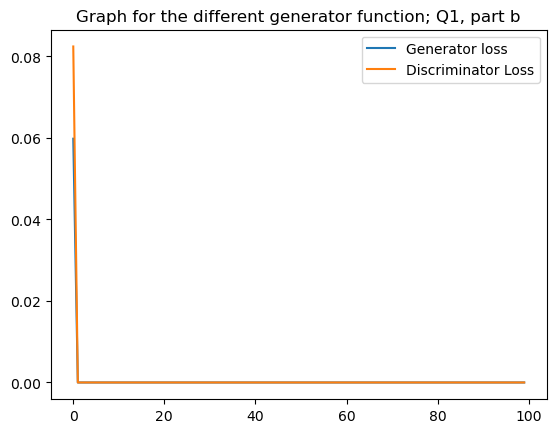

In [85]:
# plot and save the generator and discriminator loss
plt.figure()
plt.plot(losses_g_wrong, label='Generator loss')
plt.plot(losses_d_wrong, label='Discriminator Loss')
plt.title("Graph for the different generator function; Q1, part b")
plt.legend()
plt.savefig('outputs_wrong/loss.png')

Updated GAN

In [43]:
class Generator_CNN(nn.Module):
    def __init__(self, nz):
      super(Generator_CNN, self).__init__()
      self.main = nn.Sequential(
          nn.ConvTranspose2d(nz, 128, 4, 1, 0),
          nn.BatchNorm2d(128),
          nn.ReLU(True),
          nn.ConvTranspose2d(128, 64, 3, 2, 1),
          nn.BatchNorm2d(64),
          nn.ReLU(True),
          nn.ConvTranspose2d(64, 32, 4, 2, 1),
          nn.BatchNorm2d(32),
          nn.ReLU(True),
          nn.ConvTranspose2d(32, 1, 4, 2, 1),
          nn.Tanh()
      )
  
    def forward(self, x):
      output = self.main(x)
      return output

class Discriminator_CNN(nn.Module):
    def __init__(self):
        super(Discriminator_CNN, self).__init__()
        self.main = nn.Sequential(
                nn.Conv2d(1, 32, 4, 2, 1),
                nn.LeakyReLU(0.2, inplace=True),
                nn.Conv2d(32,64, 4, 2, 1),
                nn.BatchNorm2d(64),
                nn.LeakyReLU(0.2, inplace=True),
                nn.Conv2d(64, 128, 3, 2, 1),
                nn.BatchNorm2d(128),
                nn.LeakyReLU(0.2, inplace=True),
                nn.Conv2d(128, 1, 4, 1, 0),
                nn.Sigmoid()
            )
    def forward(self, x):
        output = self.main(x)
        return output.view(-1, 1).squeeze(1)

In [44]:
generator_cnn = Generator_CNN(nz).to(device)
print(generator_cnn)
discriminator_cnn = Discriminator_CNN().to(device)
print(discriminator_cnn)

Generator_CNN(
  (main): Sequential(
    (0): ConvTranspose2d(128, 128, kernel_size=(4, 4), stride=(1, 1))
    (1): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU(inplace=True)
    (3): ConvTranspose2d(128, 64, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1))
    (4): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (5): ReLU(inplace=True)
    (6): ConvTranspose2d(64, 32, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1))
    (7): BatchNorm2d(32, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (8): ReLU(inplace=True)
    (9): ConvTranspose2d(32, 1, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1))
    (10): Tanh()
  )
)
Discriminator_CNN(
  (main): Sequential(
    (0): Conv2d(1, 32, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1))
    (1): LeakyReLU(negative_slope=0.2, inplace=True)
    (2): Conv2d(32, 64, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1))
    (3): BatchNorm2d(64

In [45]:
'''This functions remain the same. I have just copied them for ease.'''

# to create real labels (1s)
def label_real(size):
    data = torch.ones(size)
    return data.to(device)
# to create fake labels (0s)
def label_fake(size):
    data = torch.zeros(size)
    return data.to(device)


In [46]:
'''This part also remains the same, with the only difference being
 that the optimizers are now for the updated discriminator and generator'''
# optimizers
optim_g_cnn = optim.Adam(generator_cnn.parameters(), lr=0.0002)
optim_d_cnn = optim.Adam(discriminator_cnn.parameters(), lr=0.0002)

In [47]:
'''This part is also copied and the names of the variables changed
to avoid overwriting'''
losses_g_cnn = [] # to store generator loss after each epoch
losses_d_cnn = [] # to store discriminator loss after each epoch
images_cnn = [] # to store images generatd by the generator

In [48]:
'''This function has to be changed slightly, to match with the way we are defining our GAN'''
# function to create the noise vector
def create_noise(sample_size, nz):
    return torch.randn(sample_size, nz, 1, 1).to(device)

In [49]:
# redifining noise using the new noise function
noise_for_cnn = create_noise(sample_size, nz)

  0%|          | 0/625 [00:00<?, ?it/s]

100%|██████████| 625/625 [02:47<00:00,  3.74it/s]


Epoch 1 of 100
Generator loss: 6.48237228, Discriminator loss: 0.02092086


100%|██████████| 625/625 [02:27<00:00,  4.25it/s]


Epoch 2 of 100
Generator loss: 7.17353153, Discriminator loss: 0.01774913


100%|██████████| 625/625 [02:26<00:00,  4.26it/s]


Epoch 3 of 100
Generator loss: 7.46450472, Discriminator loss: 0.01657355


100%|██████████| 625/625 [02:24<00:00,  4.34it/s]


Epoch 4 of 100
Generator loss: 6.76010227, Discriminator loss: 0.03375259


100%|██████████| 625/625 [02:25<00:00,  4.29it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


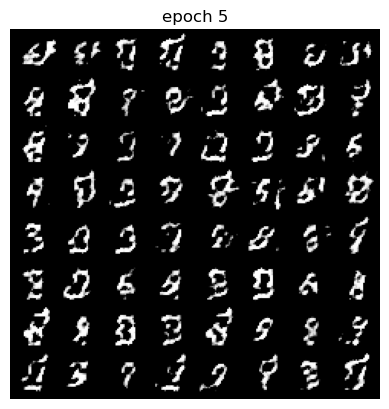

Epoch 5 of 100
Generator loss: 6.30541706, Discriminator loss: 0.04220549


100%|██████████| 625/625 [02:34<00:00,  4.05it/s]


Epoch 6 of 100
Generator loss: 6.20328999, Discriminator loss: 0.06940866


100%|██████████| 625/625 [02:22<00:00,  4.38it/s]


Epoch 7 of 100
Generator loss: 4.59650517, Discriminator loss: 0.17058791


100%|██████████| 625/625 [02:23<00:00,  4.36it/s]


Epoch 8 of 100
Generator loss: 3.75629163, Discriminator loss: 0.24004987


100%|██████████| 625/625 [02:22<00:00,  4.37it/s]


Epoch 9 of 100
Generator loss: 3.29647088, Discriminator loss: 0.30421409


100%|██████████| 625/625 [02:22<00:00,  4.38it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


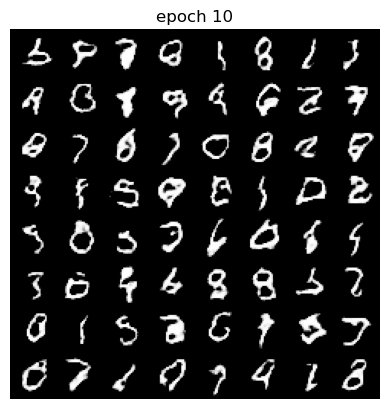

Epoch 10 of 100
Generator loss: 2.95770741, Discriminator loss: 0.31830686


100%|██████████| 625/625 [02:21<00:00,  4.43it/s]


Epoch 11 of 100
Generator loss: 2.93994403, Discriminator loss: 0.33818838


100%|██████████| 625/625 [02:20<00:00,  4.44it/s]


Epoch 12 of 100
Generator loss: 2.82229114, Discriminator loss: 0.35804239


100%|██████████| 625/625 [02:20<00:00,  4.44it/s]


Epoch 13 of 100
Generator loss: 2.79569697, Discriminator loss: 0.34288895


100%|██████████| 625/625 [02:20<00:00,  4.44it/s]


Epoch 14 of 100
Generator loss: 2.76206470, Discriminator loss: 0.35298604


100%|██████████| 625/625 [02:21<00:00,  4.43it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


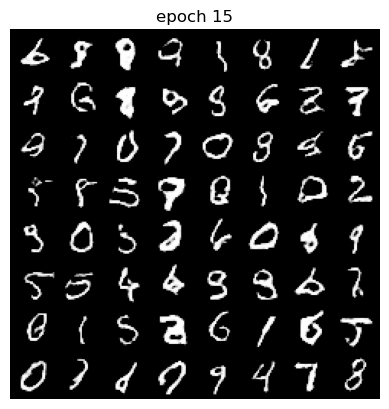

Epoch 15 of 100
Generator loss: 2.77702236, Discriminator loss: 0.37073320


100%|██████████| 625/625 [02:20<00:00,  4.44it/s]


Epoch 16 of 100
Generator loss: 2.71530962, Discriminator loss: 0.37794769


100%|██████████| 625/625 [02:20<00:00,  4.44it/s]


Epoch 17 of 100
Generator loss: 2.80033779, Discriminator loss: 0.35243917


100%|██████████| 625/625 [02:20<00:00,  4.43it/s]


Epoch 18 of 100
Generator loss: 2.79532146, Discriminator loss: 0.37303028


100%|██████████| 625/625 [02:20<00:00,  4.44it/s]


Epoch 19 of 100
Generator loss: 2.77869701, Discriminator loss: 0.36325175


100%|██████████| 625/625 [02:21<00:00,  4.42it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


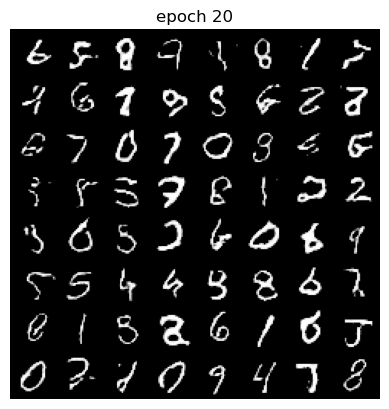

Epoch 20 of 100
Generator loss: 2.79716444, Discriminator loss: 0.36253718


100%|██████████| 625/625 [02:20<00:00,  4.44it/s]


Epoch 21 of 100
Generator loss: 2.87183237, Discriminator loss: 0.34222993


100%|██████████| 625/625 [02:21<00:00,  4.43it/s]


Epoch 22 of 100
Generator loss: 2.80847430, Discriminator loss: 0.36488092


100%|██████████| 625/625 [02:20<00:00,  4.44it/s]


Epoch 23 of 100
Generator loss: 2.86257434, Discriminator loss: 0.33697894


100%|██████████| 625/625 [02:20<00:00,  4.44it/s]


Epoch 24 of 100
Generator loss: 2.91099691, Discriminator loss: 0.32075158


100%|██████████| 625/625 [02:21<00:00,  4.43it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


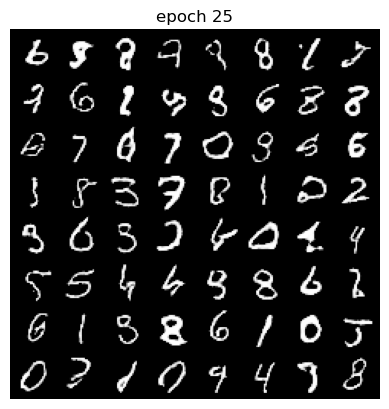

Epoch 25 of 100
Generator loss: 2.90606308, Discriminator loss: 0.33064905


100%|██████████| 625/625 [02:22<00:00,  4.38it/s]


Epoch 26 of 100
Generator loss: 2.93158817, Discriminator loss: 0.34067425


100%|██████████| 625/625 [02:21<00:00,  4.42it/s]


Epoch 27 of 100
Generator loss: 2.88953543, Discriminator loss: 0.36358419


100%|██████████| 625/625 [02:21<00:00,  4.43it/s]


Epoch 28 of 100
Generator loss: 2.87031078, Discriminator loss: 0.31582519


100%|██████████| 625/625 [02:20<00:00,  4.43it/s]


Epoch 29 of 100
Generator loss: 3.00445580, Discriminator loss: 0.30459765


100%|██████████| 625/625 [02:20<00:00,  4.45it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


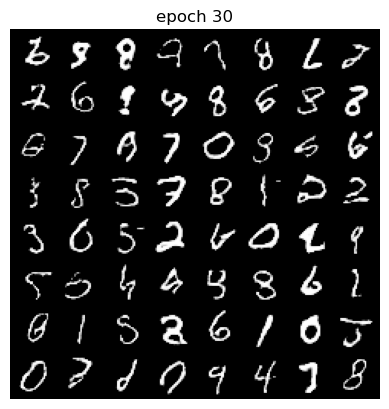

Epoch 30 of 100
Generator loss: 3.01889181, Discriminator loss: 0.31225514


100%|██████████| 625/625 [02:23<00:00,  4.36it/s]


Epoch 31 of 100
Generator loss: 2.99603462, Discriminator loss: 0.31380114


100%|██████████| 625/625 [02:24<00:00,  4.31it/s]


Epoch 32 of 100
Generator loss: 3.03973556, Discriminator loss: 0.32075861


100%|██████████| 625/625 [02:21<00:00,  4.40it/s]


Epoch 33 of 100
Generator loss: 3.02694631, Discriminator loss: 0.30195978


100%|██████████| 625/625 [02:25<00:00,  4.31it/s]


Epoch 34 of 100
Generator loss: 3.02717257, Discriminator loss: 0.30449462


100%|██████████| 625/625 [02:22<00:00,  4.40it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


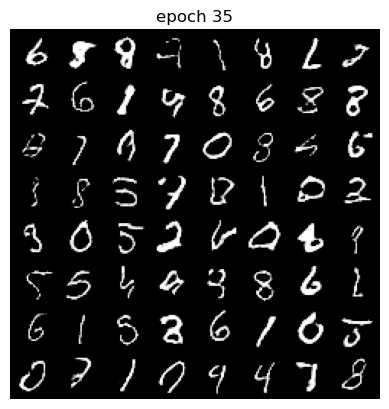

Epoch 35 of 100
Generator loss: 3.06089234, Discriminator loss: 0.29848024


100%|██████████| 625/625 [02:21<00:00,  4.40it/s]


Epoch 36 of 100
Generator loss: 3.10417509, Discriminator loss: 0.32065243


100%|██████████| 625/625 [02:21<00:00,  4.41it/s]


Epoch 37 of 100
Generator loss: 3.12536454, Discriminator loss: 0.27730700


100%|██████████| 625/625 [02:21<00:00,  4.41it/s]


Epoch 38 of 100
Generator loss: 3.00288272, Discriminator loss: 0.35344866


100%|██████████| 625/625 [02:21<00:00,  4.43it/s]


Epoch 39 of 100
Generator loss: 3.14348388, Discriminator loss: 0.28394192


100%|██████████| 625/625 [02:20<00:00,  4.43it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


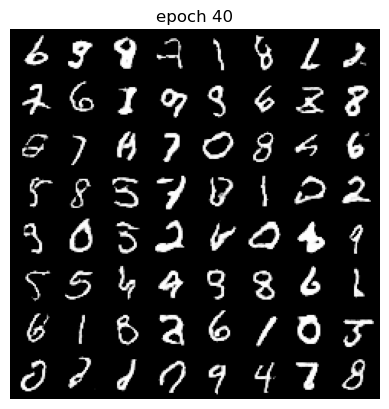

Epoch 40 of 100
Generator loss: 3.16525173, Discriminator loss: 0.30062929


100%|██████████| 625/625 [02:21<00:00,  4.41it/s]


Epoch 41 of 100
Generator loss: 3.12603188, Discriminator loss: 0.28669703


100%|██████████| 625/625 [02:22<00:00,  4.39it/s]


Epoch 42 of 100
Generator loss: 3.09388018, Discriminator loss: 0.29785690


100%|██████████| 625/625 [02:22<00:00,  4.38it/s]


Epoch 43 of 100
Generator loss: 3.12434220, Discriminator loss: 0.30463761


100%|██████████| 625/625 [02:22<00:00,  4.38it/s]


Epoch 44 of 100
Generator loss: 3.21130013, Discriminator loss: 0.28882331


100%|██████████| 625/625 [02:23<00:00,  4.34it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


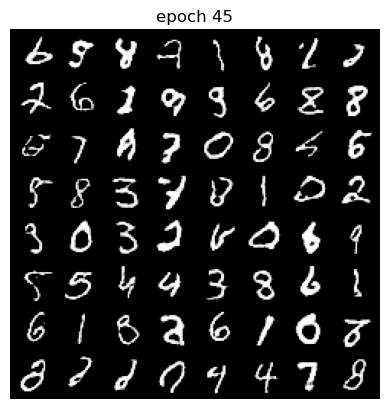

Epoch 45 of 100
Generator loss: 3.20551252, Discriminator loss: 0.29171091


100%|██████████| 625/625 [02:21<00:00,  4.42it/s]


Epoch 46 of 100
Generator loss: 3.19265795, Discriminator loss: 0.26245221


100%|██████████| 625/625 [02:22<00:00,  4.39it/s]


Epoch 47 of 100
Generator loss: 3.30184460, Discriminator loss: 0.29370809


100%|██████████| 625/625 [02:21<00:00,  4.40it/s]


Epoch 48 of 100
Generator loss: 3.16916394, Discriminator loss: 0.31284025


100%|██████████| 625/625 [02:22<00:00,  4.37it/s]


Epoch 49 of 100
Generator loss: 3.22274518, Discriminator loss: 0.27804983


100%|██████████| 625/625 [02:22<00:00,  4.40it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


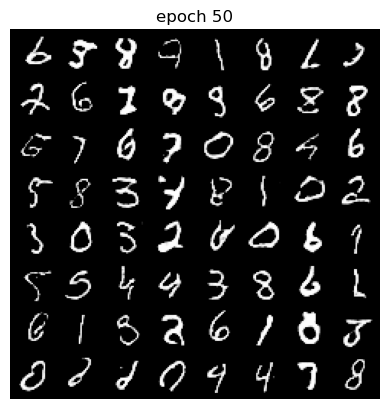

Epoch 50 of 100
Generator loss: 3.32253408, Discriminator loss: 0.24530739


100%|██████████| 625/625 [02:21<00:00,  4.43it/s]


Epoch 51 of 100
Generator loss: 3.31186032, Discriminator loss: 0.30457285


100%|██████████| 625/625 [02:21<00:00,  4.40it/s]


Epoch 52 of 100
Generator loss: 3.26041603, Discriminator loss: 0.27355528


100%|██████████| 625/625 [02:21<00:00,  4.42it/s]


Epoch 53 of 100
Generator loss: 3.33629203, Discriminator loss: 0.26087591


100%|██████████| 625/625 [02:20<00:00,  4.43it/s]


Epoch 54 of 100
Generator loss: 3.37140083, Discriminator loss: 0.29198521


100%|██████████| 625/625 [02:21<00:00,  4.43it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


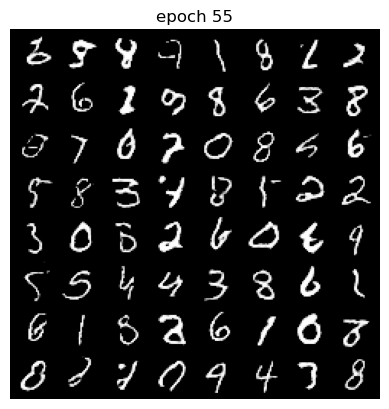

Epoch 55 of 100
Generator loss: 3.34759688, Discriminator loss: 0.25953582


100%|██████████| 625/625 [02:21<00:00,  4.41it/s]


Epoch 56 of 100
Generator loss: 3.36871147, Discriminator loss: 0.25812289


100%|██████████| 625/625 [02:22<00:00,  4.37it/s]


Epoch 57 of 100
Generator loss: 3.41216302, Discriminator loss: 0.25979841


100%|██████████| 625/625 [02:22<00:00,  4.39it/s]


Epoch 58 of 100
Generator loss: 3.49110055, Discriminator loss: 0.25746885


100%|██████████| 625/625 [02:22<00:00,  4.38it/s]


Epoch 59 of 100
Generator loss: 3.36820865, Discriminator loss: 0.28744069


100%|██████████| 625/625 [02:21<00:00,  4.42it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


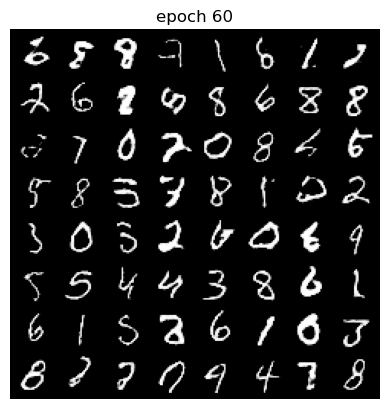

Epoch 60 of 100
Generator loss: 3.37026048, Discriminator loss: 0.24517152


100%|██████████| 625/625 [02:22<00:00,  4.38it/s]


Epoch 61 of 100
Generator loss: 3.39906430, Discriminator loss: 0.24497372


100%|██████████| 625/625 [02:20<00:00,  4.43it/s]


Epoch 62 of 100
Generator loss: 3.38891554, Discriminator loss: 0.25521532


100%|██████████| 625/625 [02:22<00:00,  4.39it/s]


Epoch 63 of 100
Generator loss: 3.39903688, Discriminator loss: 0.28237918


100%|██████████| 625/625 [02:21<00:00,  4.42it/s]


Epoch 64 of 100
Generator loss: 3.43209887, Discriminator loss: 0.24633545


100%|██████████| 625/625 [02:20<00:00,  4.44it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


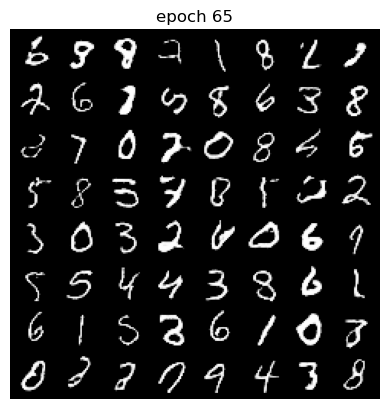

Epoch 65 of 100
Generator loss: 3.50565481, Discriminator loss: 0.22162591


100%|██████████| 625/625 [02:21<00:00,  4.42it/s]


Epoch 66 of 100
Generator loss: 3.48393011, Discriminator loss: 0.24885532


100%|██████████| 625/625 [02:21<00:00,  4.43it/s]


Epoch 67 of 100
Generator loss: 3.48787951, Discriminator loss: 0.24127419


100%|██████████| 625/625 [02:20<00:00,  4.44it/s]


Epoch 68 of 100
Generator loss: 3.50500321, Discriminator loss: 0.23257458


100%|██████████| 625/625 [02:22<00:00,  4.38it/s]


Epoch 69 of 100
Generator loss: 3.60177875, Discriminator loss: 0.20359302


100%|██████████| 625/625 [02:22<00:00,  4.40it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


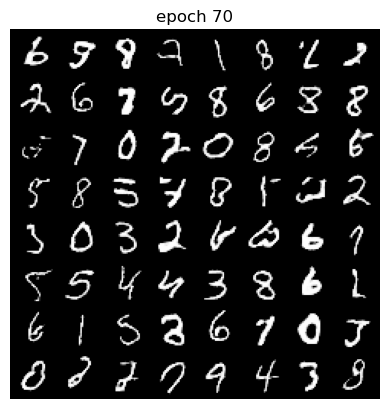

Epoch 70 of 100
Generator loss: 3.61402965, Discriminator loss: 0.23604183


100%|██████████| 625/625 [02:22<00:00,  4.38it/s]


Epoch 71 of 100
Generator loss: 3.56259584, Discriminator loss: 0.23395550


100%|██████████| 625/625 [02:21<00:00,  4.42it/s]


Epoch 72 of 100
Generator loss: 3.60355639, Discriminator loss: 0.24199454


100%|██████████| 625/625 [02:21<00:00,  4.43it/s]


Epoch 73 of 100
Generator loss: 3.61424446, Discriminator loss: 0.20940724


100%|██████████| 625/625 [02:23<00:00,  4.36it/s]


Epoch 74 of 100
Generator loss: 3.71749377, Discriminator loss: 0.21565051


100%|██████████| 625/625 [02:20<00:00,  4.43it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


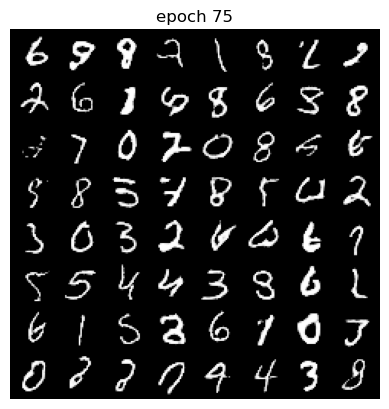

Epoch 75 of 100
Generator loss: 3.61401868, Discriminator loss: 0.24640141


100%|██████████| 625/625 [02:22<00:00,  4.38it/s]


Epoch 76 of 100
Generator loss: 3.77444959, Discriminator loss: 0.18854520


100%|██████████| 625/625 [02:22<00:00,  4.39it/s]


Epoch 77 of 100
Generator loss: 3.80999088, Discriminator loss: 0.19518599


100%|██████████| 625/625 [02:21<00:00,  4.42it/s]


Epoch 78 of 100
Generator loss: 3.84038520, Discriminator loss: 0.20454505


100%|██████████| 625/625 [02:21<00:00,  4.43it/s]


Epoch 79 of 100
Generator loss: 3.90344238, Discriminator loss: 0.22504795


100%|██████████| 625/625 [02:21<00:00,  4.42it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


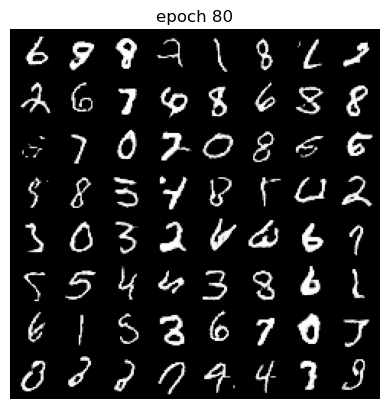

Epoch 80 of 100
Generator loss: 3.86067152, Discriminator loss: 0.18222955


100%|██████████| 625/625 [02:21<00:00,  4.43it/s]


Epoch 81 of 100
Generator loss: 3.84170365, Discriminator loss: 0.18442416


100%|██████████| 625/625 [02:22<00:00,  4.39it/s]


Epoch 82 of 100
Generator loss: 3.80421257, Discriminator loss: 0.20463641


100%|██████████| 625/625 [02:21<00:00,  4.43it/s]


Epoch 83 of 100
Generator loss: 3.73424792, Discriminator loss: 0.22051419


100%|██████████| 625/625 [02:22<00:00,  4.38it/s]


Epoch 84 of 100
Generator loss: 3.78506541, Discriminator loss: 0.19273591


100%|██████████| 625/625 [02:22<00:00,  4.39it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


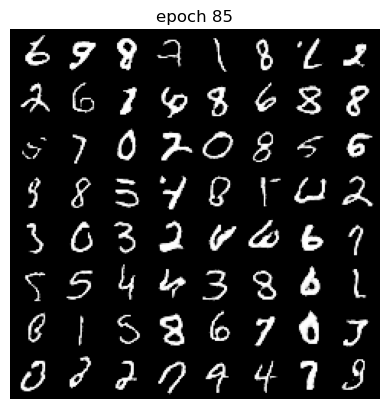

Epoch 85 of 100
Generator loss: 3.87811399, Discriminator loss: 0.20718968


100%|██████████| 625/625 [02:21<00:00,  4.42it/s]


Epoch 86 of 100
Generator loss: 3.73895645, Discriminator loss: 0.25663215


100%|██████████| 625/625 [02:22<00:00,  4.39it/s]


Epoch 87 of 100
Generator loss: 3.79330635, Discriminator loss: 0.18014142


100%|██████████| 625/625 [02:30<00:00,  4.15it/s]


Epoch 88 of 100
Generator loss: 3.81019974, Discriminator loss: 0.20554738


100%|██████████| 625/625 [02:22<00:00,  4.37it/s]


Epoch 89 of 100
Generator loss: 3.81925535, Discriminator loss: 0.18436250


100%|██████████| 625/625 [02:23<00:00,  4.36it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


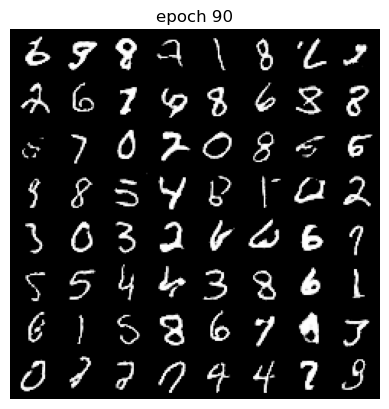

Epoch 90 of 100
Generator loss: 3.85615540, Discriminator loss: 0.20743749


100%|██████████| 625/625 [02:21<00:00,  4.40it/s]


Epoch 91 of 100
Generator loss: 3.89360547, Discriminator loss: 0.18588533


100%|██████████| 625/625 [02:20<00:00,  4.43it/s]


Epoch 92 of 100
Generator loss: 4.00453854, Discriminator loss: 0.17454670


100%|██████████| 625/625 [02:21<00:00,  4.43it/s]


Epoch 93 of 100
Generator loss: 3.87096453, Discriminator loss: 0.20595179


100%|██████████| 625/625 [02:20<00:00,  4.43it/s]


Epoch 94 of 100
Generator loss: 3.93892574, Discriminator loss: 0.17318599


100%|██████████| 625/625 [02:21<00:00,  4.41it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


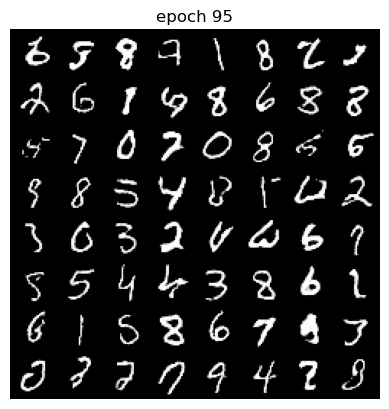

Epoch 95 of 100
Generator loss: 3.91482353, Discriminator loss: 0.20049140


100%|██████████| 625/625 [02:21<00:00,  4.43it/s]


Epoch 96 of 100
Generator loss: 3.91629267, Discriminator loss: 0.19287698


100%|██████████| 625/625 [02:20<00:00,  4.44it/s]


Epoch 97 of 100
Generator loss: 4.01737452, Discriminator loss: 0.16111447


100%|██████████| 625/625 [02:24<00:00,  4.34it/s]


Epoch 98 of 100
Generator loss: 4.06933355, Discriminator loss: 0.17221972


100%|██████████| 625/625 [02:23<00:00,  4.36it/s]


Epoch 99 of 100
Generator loss: 4.04106903, Discriminator loss: 0.17926633


100%|██████████| 625/625 [02:22<00:00,  4.38it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


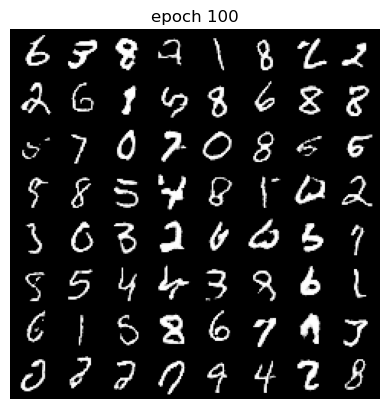

Epoch 100 of 100
Generator loss: 4.05684614, Discriminator loss: 0.18416242


In [52]:
'''Once again this part is also almost the same, with the only change being 
variable names (or function names if they have been redefined)'''

torch.manual_seed(7777)

def generator_loss(output, true_label):
    ############ YOUR CODE HERE ##########
    
    return criterion(output, true_label)

    ######################################
    
def discriminator_loss(output, true_label):
    ############ YOUR CODE HERE ##########
    

    ones = label_real(true_label.size()[0])
    zeros = label_fake(output.size()[0])
    # temp =  criterion(output, zeros)
    return criterion(output, zeros) + criterion(true_label, ones)
    

    ######################################
    

for epoch in range(epochs):
    loss_g_cnn = 0.0
    loss_d_cnn = 0.0
    for bi, data in tqdm(enumerate(train_loader), total=int(len(train_data)/train_loader.batch_size)):
            
        # DISCRIMINATOR TRAINING FIRST     
        discriminator_cnn.zero_grad()
        real_imgs, _ = data
        batch_size = real_imgs.size(0)
        
        real_vals = discriminator_cnn(real_imgs)    
        noise_cnn = create_noise(batch_size, nz)
        fake_imgs = generator_cnn(noise_cnn)
        fake_vals = discriminator_cnn(fake_imgs.detach())
        err_disc = discriminator_loss(fake_vals, real_vals)
        loss_d_cnn += err_disc
        err_disc.backward()
        optim_d_cnn.step()
        
        # GENERATOR TRAINING AFTER
        generator_cnn.zero_grad()
        # we have updated discriminator so:
        fake_imgs_gen = generator_cnn(noise_cnn)
        gen_fake_vals = discriminator_cnn(fake_imgs_gen)      
        labels_one = label_real(batch_size)
        err_gen = generator_loss(gen_fake_vals, labels_one)
        loss_g_cnn += err_gen
        err_gen.backward()
        optim_g_cnn.step()
    
        ######################################
    
    
    # create the final fake image for the epoch
    generated_img = generator_cnn(noise_for_cnn).cpu().detach()
    
    # make the images as grid
    generated_img = make_grid(generated_img)
    
    # visualize generated images
    if (epoch + 1) % 5 == 0:
        plt.imshow(generated_img.permute(1, 2, 0))
        plt.title(f'epoch {epoch+1}')
        plt.axis('off')
        plt.show()
    
    # save the generated torch tensor models to disk
    save_generator_image(generated_img, f"outputs_cnn/gen_img{epoch+1}.png")
    images_cnn.append(generated_img)
    epoch_loss_g = loss_g_cnn / bi # total generator loss for the epoch
    epoch_loss_d = loss_d_cnn / bi # total discriminator loss for the epoch
    losses_g_cnn.append(epoch_loss_g)
    losses_d_cnn.append(epoch_loss_d)
    
    print(f"Epoch {epoch+1} of {epochs}")
    print(f"Generator loss: {epoch_loss_g:.8f}, Discriminator loss: {epoch_loss_d:.8f}")

In [53]:
print('DONE TRAINING')
torch.save(generator_cnn.state_dict(), 'outputs_cnn/generator.pth')

DONE TRAINING


In [54]:
# save the generated images as GIF file
imgs = [np.array(to_pil_image(img)) for img in images_cnn]
imageio.mimsave('outputs_cnn/generator_images.gif', imgs)

In [55]:
losses_d_cnn  =[x.detach() for x in losses_d_cnn]
losses_g_cnn  =[x.detach() for x in losses_g_cnn]

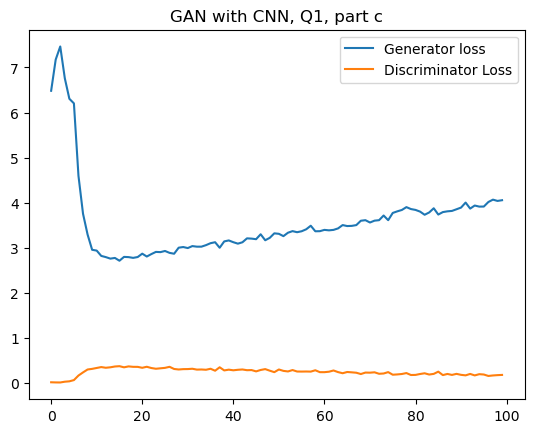

In [56]:
# plot and save the generator and discriminator loss
plt.figure()
plt.plot(losses_g_cnn, label='Generator loss')
plt.plot(losses_d_cnn, label='Discriminator Loss')
plt.title("GAN with CNN, Q1, part c")
plt.legend()
plt.savefig('outputs_cnn/loss.png')